<a href="https://colab.research.google.com/github/AliButtar/TFOD-API-V2-Image-Segmentation/blob/master/TFOD_API_V2_MicroController_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Step 1: Installation and Setup of TFOD API Version 2

In [1]:
!nvidia-smi

Fri Sep 25 07:58:07 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.66       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   61C    P8    33W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install labelme
!pip install pycocotools

     |████████████████████████████████| 1.5MB 2.6MB/s 
     |████████████████████████████████| 7.7MB 14.9MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 71.6MB 43kB/s 
     |████████████████████████████████| 286kB 41.5MB/s 
  Created wheel for imgviz: filename=imgviz-1.2.2-cp36-none-any.whl size=7673844 sha256=ab48caace583126875c524253c8aecc5f6aff4f42dc6cc2b9cc498983d3ce783
  Stored in directory: /root/.cache/pip/wheels/ec/a2/24/49c04d92128ca3f8fcb2a59b422b7a3e47fe660d82d4be13e0
Successfully built imgviz
  Created wheel for labelme: filename=labelme-4.5.6-cp36-none-any.whl size=1464599 sha256=bdef2531d567092954ee939ae6cce1a3c793d03ab597d067170828d657711ba2
  Stored in directory: /root/.cache/pip/wheels/10/a4/39/d225864c71769c24f9e41fc17e8e1f4a341a1191041a494dd4
Successfully built labelme


In [3]:
import os
import shutil
import math
import datetime
import sys


import glob
import urllib
import tarfile
import urllib.request
from urllib.request import urlopen
from io import BytesIO
from zipfile import ZipFile
import re
import pathlib


import matplotlib.pyplot as plt
%matplotlib inline

# This will let you download any video from youtube
#import pafy
import gdown
#import cv2
import numpy as np
import time

import tensorflow as tf

from PIL import Image
from IPython.display import display
from collections import defaultdict
from io import StringIO
import six.moves.urllib as urllib
import sys

print("DETECTED VERSION: " + tf.__version__)

DETECTED VERSION: 2.3.0


In [ ]:
# tf.get_logger().setLevel('ERROR')           # Suppress TensorFlow logging (2)

# # Enable GPU dynamic memory allocation
# gpus = tf.config.experimental.list_physical_devices('GPU')
# for gpu in gpus:
#     tf.config.experimental.set_memory_growth(gpu, True)

In [4]:
# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2197, done.
remote: Counting objects: 100% (2197/2197), done.
remote: Compressing objects: 100% (1898/1898), done.
remote: Total 2197 (delta 528), reused 958 (delta 273), pack-reused 0
Receiving objects: 100% (2197/2197), 30.43 MiB | 13.61 MiB/s, done.
Resolving deltas: 100% (528/528), done.


In [5]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1578120 sha256=d10022ca7c6e02ed59581b0eeca4665ae8a0eb8ee402b1a1225fb53b8d1ee760
  Stored in directory: /tmp/pip-ephem-wheel-cache-6y9m9n__/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
  Created wheel for avro-python3: filename=avro_python3-1.10.0-cp36-none-any.whl size=43735 sha256=7ca47dd0f11ab08d53e0313ea1cacc885b347f75d2919cd515df47985cdbb2f9
  Stored in directory: /root/.cache/pip/wheels/3f/15/cd/fe4ec8b88c130393464703ee8111e2cddebdc40e1b59ea85e9
  Created wheel for dill: filename=dill-0.3.1.1-cp36-none-any.whl size=78532 sha256=f113bce29da77917105707737c260ba712589b1e70ac99de26bb1e14e9837f08
  Stored in directory: /root/.cache/pip/wheels/59/b1/91/f02e76c732915c4015ab4010f3015469866c1eb9b14058d8e7
  Created wheel for hdfs: filename=hdfs-2.5.8-cp36-none-any.whl size=33213 sha256=42d0425d694ecfe8547110c2946d1e9347c7448ff757e11663332b3f0f

ERROR: pydrive 1.3.1 has requirement oauth2client>=4.0.0, but you'll have oauth2client 3.0.0 which is incompatible.
ERROR: multiprocess 0.70.10 has requirement dill>=0.3.2, but you'll have dill 0.3.1.1 which is incompatible.
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.24.0 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: apache-beam 2.24.0 has requirement avro-python3!=1.9.2,<1.10.0,>=1.8.1; python_version >= "3.0", but you'll have avro-python3 1.10.0 which is incompatible.


In [6]:
# Test the installation.
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2020-09-25 07:59:24.447998: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Running tests under Python 3.6.9: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2020-09-25 07:59:26.967592: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-25 07:59:27.015202: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-25 07:59:27.016006: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2020-09-25 07:59:27.016059: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfull

# Step 2: Download Training Data and Labeling it

Downloading Data From Kaggle which has been annotated using the label me tool :
 https://www.kaggle.com/tannergi/microcontroller-segmentation

In [7]:
# Install Kaggle API
!pip install -q kaggle
!pip install -q kaggle-cli

     |████████████████████████████████| 81kB 2.6MB/s 
     |████████████████████████████████| 5.3MB 4.3MB/s 
     |████████████████████████████████| 133kB 40.7MB/s 
     |████████████████████████████████| 51kB 5.9MB/s 


Changing Environment Variables to be able to download data

In [8]:
os.environ['KAGGLE_USERNAME'] = "alibuttarr6" 
os.environ['KAGGLE_KEY'] = "ce8d5cf74f253ec5386fdd07d9038859"

In [9]:
!kaggle datasets download -d tannergi/microcontroller-segmentation --unzip

 54% 9.00M/16.7M [00:01<00:01, 6.77MB/s]
100% 16.7M/16.7M [00:01<00:00, 10.2MB/s]


# Step 3: Generate TFRecords

* Using the scripts in the Support folder we first create coco format json files for train and test images 

* Then we use the json files and the training and testing images to create tf recrods for the model

In [10]:
# The script used to convert coco format json files into tf records
!gdown --id 1nAJTe13_hK8QmZmvTc2ejA3oa-IKUuR- --output create_coco_tf_record.py

Downloading...
From: https://drive.google.com/uc?id=1nAJTe13_hK8QmZmvTc2ejA3oa-IKUuR-
To: /content/create_coco_tf_record.py
100% 10.2k/10.2k [00:00<00:00, 16.1MB/s]


In [11]:
!python /content/microcontroller-segmentation/labelme2coco.py /content/microcontroller-segmentation/train --output train.json
!python /content/microcontroller-segmentation/labelme2coco.py /content/microcontroller-segmentation/test --output test.json

save coco json
train.json
save coco json
test.json


In [12]:
!python create_coco_tf_record.py --logtostderr --train_image_dir=microcontroller-segmentation/train --test_image_dir=microcontroller-segmentation/test --train_annotations_file=train.json --test_annotations_file=test.json --output_dir=./

2020-09-25 08:00:39.569559: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
INFO:tensorflow:Found groundtruth annotations. Building annotations index.
I0925 08:00:41.130831 139691341260672 create_coco_tf_record.py:214] Found groundtruth annotations. Building annotations index.
INFO:tensorflow:0 images are missing annotations.
I0925 08:00:41.131167 139691341260672 create_coco_tf_record.py:227] 0 images are missing annotations.
INFO:tensorflow:On image 0 of 142
I0925 08:00:41.131896 139691341260672 create_coco_tf_record.py:232] On image 0 of 142
INFO:tensorflow:On image 100 of 142
I0925 08:00:42.063983 139691341260672 create_coco_tf_record.py:232] On image 100 of 142
INFO:tensorflow:Finished writing, skipped 0 annotations.
I0925 08:00:42.510107 139691341260672 create_coco_tf_record.py:239] Finished writing, skipped 0 annotations.
INFO:tensorflow:Found groundtruth annotations. Building annotations index.
I0925 08:00:42.

## Create Label Map

You can change and add more items, be sure to match them accordingly to the coco format json files we just created.

In [13]:
pbtxt = '''
item {
    id: 1
    name: 'Arduino'
}
item {
    id: 2
    name: 'ESP8266'
}
item {
    id: 3
    name: 'Heltec'
}
item {
    id: 4
    name: 'Raspberry'
}

'''

with open("/content/labelmap.pbtxt", "w") as text_file:
    text_file.write(pbtxt)

# Step 4: Download Mask RCNN Model and configuring it to work with our data

## Downloading

In [14]:
model_url = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.tar.gz'
model_name = 'mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.tar.gz'


!wget {model_url}
!tar -xf {model_name}

--2020-09-25 08:00:44--  http://download.tensorflow.org/models/object_detection/tf2/20200711/mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 64.233.189.128, 2404:6800:4008:c07::80
Connecting to download.tensorflow.org (download.tensorflow.org)|64.233.189.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 484546405 (462M) [application/x-tar]
Saving to: ‘mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.tar.gz’

mask_rcnn_inception 100%[===================>] 462.10M  71.1MB/s    in 7.6s    

2020-09-25 08:00:52 (60.4 MB/s) - ‘mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.tar.gz’ saved [484546405/484546405]



## Configuring

In [15]:
train_record_path = '/content/train.record'
test_record_path = '/content/test.record'
labelmap_path = '/content/labelmap.pbtxt'

fine_tune_checkpoint = 'mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8/checkpoint/ckpt-0'

batch_size = 1
num_steps = 1000
num_eval_steps = 1000

In [17]:
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.config

base_config_path = 'mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.config'

--2020-09-25 08:01:16--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3943 (3.9K) [text/plain]
Saving to: ‘mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.config’

mask_rcnn_inception 100%[===================>]   3.85K  --.-KB/s    in 0s      

2020-09-25 08:01:16 (61.7 MB/s) - ‘mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.config’ saved [3943/3943]



In [18]:
import re

with open(base_config_path) as f:
    config = f.read()

with open('model_config.config', 'w') as f:
  
  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
             'label_map_path: "{}"'.format(labelmap_path), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                  'input_path: "{}"'.format(train_record_path), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 
                  'input_path: "{}"'.format(test_record_path), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(4), config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  
  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"', 
             'fine_tune_checkpoint_type: "{}"'.format('detection'), config)
  
  f.write(config)

# Step 5: Training 

In [19]:
# model_dir = '/content/mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8'
model_dir = 'training/'
pipeline_config_path = 'model_config.config'

In [20]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr

2020-09-25 08:01:35.717511: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-25 08:01:38.095485: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-25 08:01:38.119047: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-25 08:01:38.119741: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2020-09-25 08:01:38.119788: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-25 08:01:38.121557: I tensorflow/stream_executor/platform/defa

## Tensorboard

In [21]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

# Step 6: Saving the Model and running Inference

In [22]:
output_directory = 'inference_graph'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}

2020-09-25 08:45:13.428778: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-25 08:45:23.509680: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-25 08:45:23.561254: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-25 08:45:23.562165: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2020-09-25 08:45:23.562217: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-25 08:45:23.594143: I tensorflow/stream_executor/platform/defa

## Detection

In [23]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [ ]:

# # patch tf1 into `utils.ops`
# utils_ops.tf = tf.compat.v1

# # Patch the location of gfile
# tf.gfile = tf.io.gfile

In [24]:
start_time = time.time()
tf.keras.backend.clear_session()
detect_fn = tf.saved_model.load('/content/inference_graph/saved_model')
end_time = time.time()
elapsed_time = end_time - start_time
print('Elapsed time: ' + str(elapsed_time) + 's')

Elapsed time: 32.632100105285645s


In [25]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = '/content/labelmap.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [26]:
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('/content/microcontroller-segmentation/test')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('/content/microcontroller-segmentation/test/IMG_20181228_102636.jpg'),
 PosixPath('/content/microcontroller-segmentation/test/IMG_20181228_102641.jpg'),
 PosixPath('/content/microcontroller-segmentation/test/IMG_20181228_102658.jpg'),
 PosixPath('/content/microcontroller-segmentation/test/IMG_20181228_102706.jpg'),
 PosixPath('/content/microcontroller-segmentation/test/IMG_20181228_102745.jpg'),
 PosixPath('/content/microcontroller-segmentation/test/IMG_20181228_102749.jpg'),
 PosixPath('/content/microcontroller-segmentation/test/IMG_20181228_102757.jpg')]

In [27]:
def run_inference_for_single_image(model, image):
  
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis, ...]
  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)
  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  need_detection_key = ['detection_classes','detection_boxes','detection_masks','detection_scores']
  output_dict = {key: output_dict[key][0, :num_detections].numpy()
                for key in need_detection_key}
  output_dict['num_detections'] = num_detections
  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
  # Handle models with masks:
  if 'detection_masks' in output_dict:
      # Reframe the the bbox mask to the image size.
      detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
          tf.convert_to_tensor(output_dict['detection_masks']), output_dict['detection_boxes'],
          image.shape[0], image.shape[1])
      detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                        tf.uint8)
      output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

  return output_dict

In [28]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

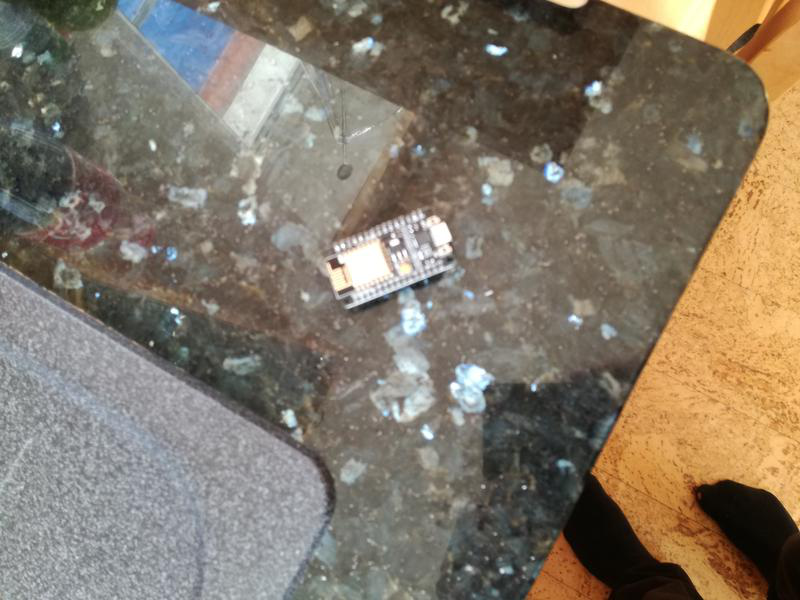

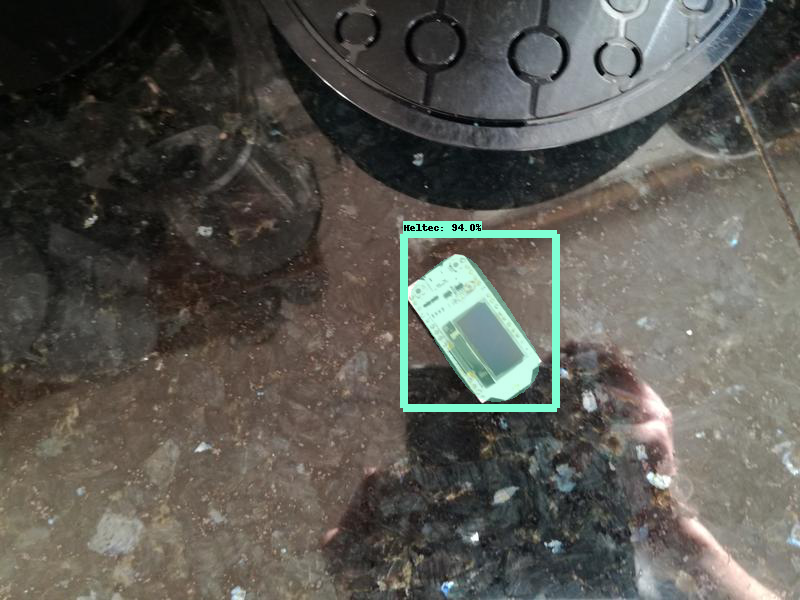

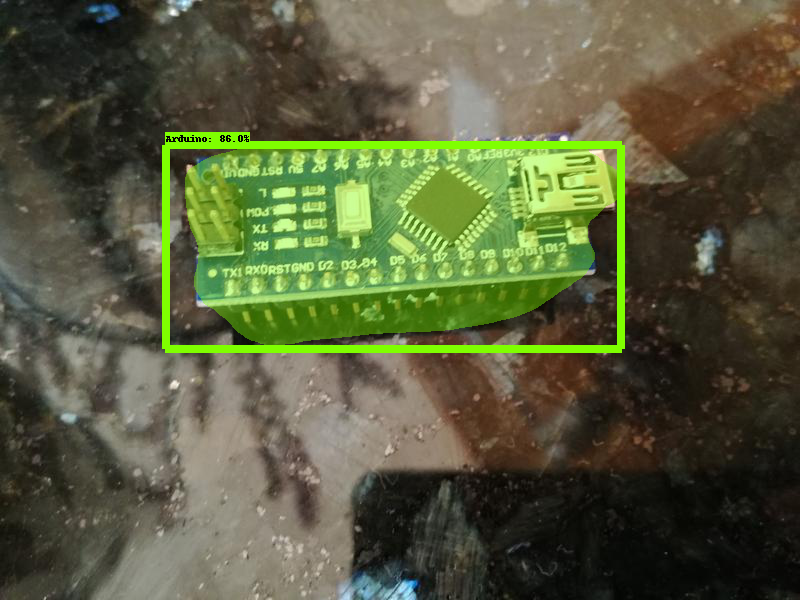

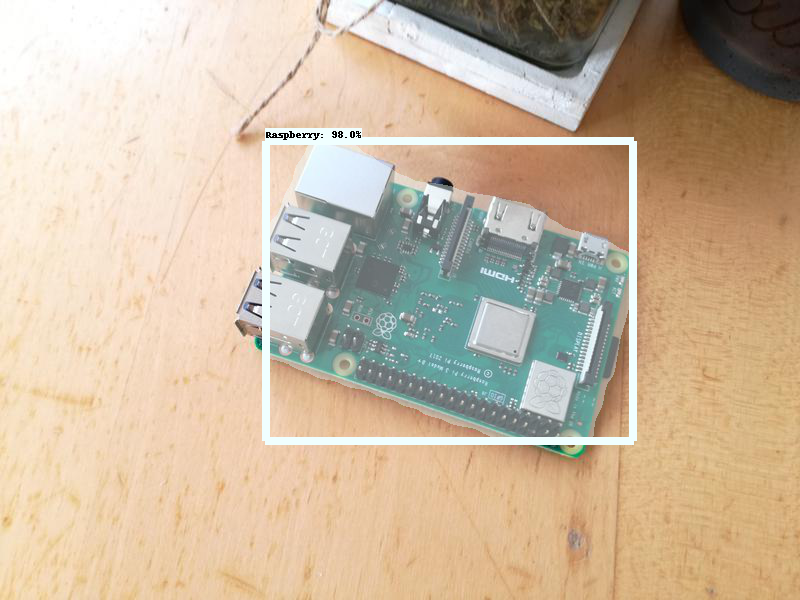

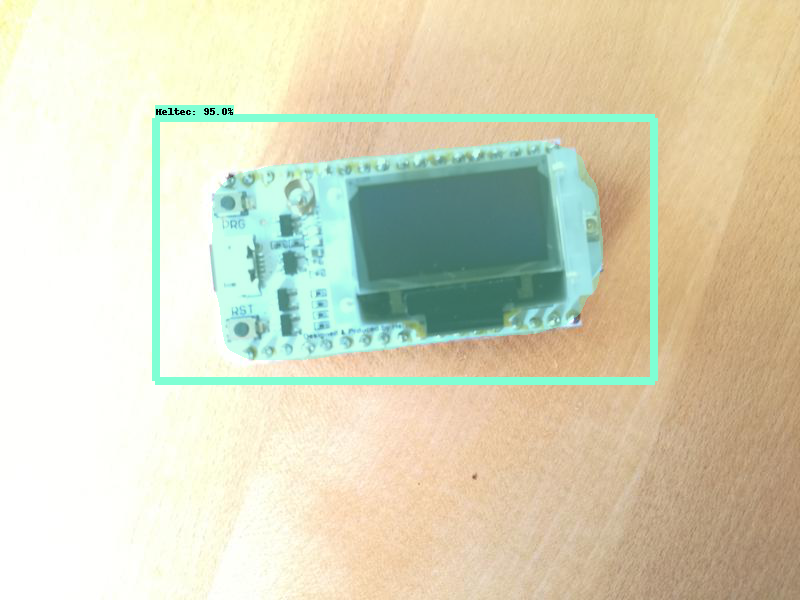

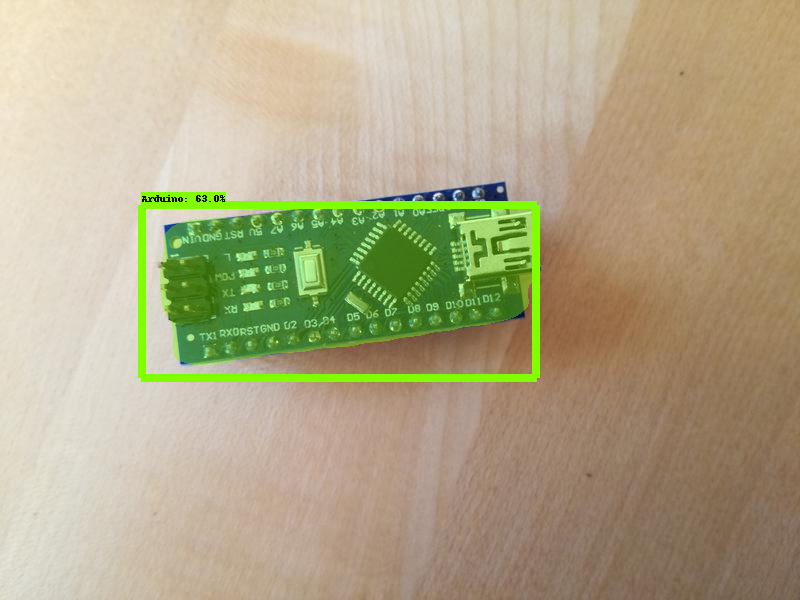

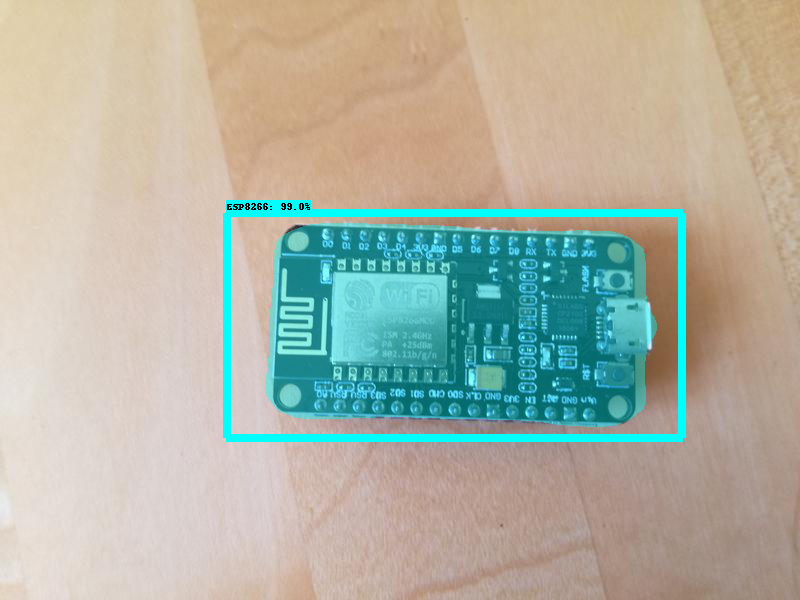

In [29]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(detect_fn, image_path) # Scroll to see inference on all images

Using this method it only detects the object using the annotations with bounding boxes

In [30]:
# Paths to images in the test folder, using 3 images
TEST_IMAGE_PATHS_2 = [
                      '/content/microcontroller-segmentation/test/IMG_20181228_102636.jpg',
                      '/content/microcontroller-segmentation/test/IMG_20181228_102641.jpg',
                      '/content/microcontroller-segmentation/test/IMG_20181228_102658.jpg'
]


In [31]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

# Load the COCO Label Map
category_index = {
    1: {'id': 1, 'name': 'Arduino'},
    2: {'id': 2, 'name': 'ESP8266'},
    3: {'id': 3, 'name': 'Heltec'},
    4: {'id': 4, 'name': 'Raspberry'},
}

In [32]:
%matplotlib inline

Elapsed time: 2.8569579124450684 second per image


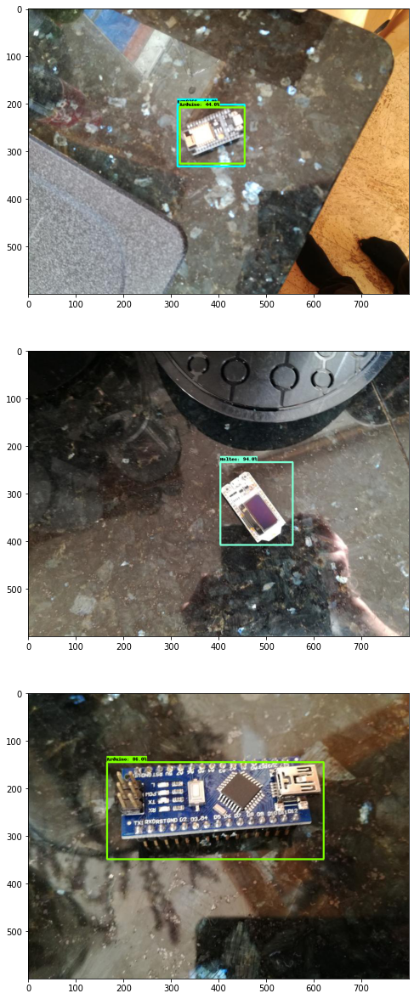

In [33]:

#image_dir = '/content/microcontroller-segmentation/test/IMG_20181228_102658.jpg'

elapsed = []
for i in range(len(TEST_IMAGE_PATHS_2)):
  #image_path = os.path.join(image_dir, 'image' + str(i + 1) + '.jpg')
  image_np = load_image_into_numpy_array(TEST_IMAGE_PATHS_2[i])
  input_tensor = np.expand_dims(image_np, 0)
  start_time = time.time()
  detections = detect_fn(input_tensor)
  end_time = time.time()
  elapsed.append(end_time - start_time)

  plt.rcParams['figure.figsize'] = [42, 21]
  label_id_offset = 1
  image_np_with_detections = image_np.copy()
  vis_util.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'][0].numpy(),
        detections['detection_classes'][0].numpy().astype(np.int32),
        detections['detection_scores'][0].numpy(),
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=.40,
        agnostic_mode=False)
  plt.subplot(len(TEST_IMAGE_PATHS_2), 1, i+1)
  plt.imshow(image_np_with_detections)

mean_elapsed = sum(elapsed) / float(len(elapsed))
print('Elapsed time: ' + str(mean_elapsed) + ' second per image')

In [ ]:
from google.colab import files
files.download(f'/content/{output_directory}/saved_model/saved_model.pb') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>